Script to explore the gene expression results of Spatialscope

Agathe, started : 03/06/2025

In [1]:
## Imports
import sys
import os
import warnings

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import anndata
import scanpy as sc

import matplotlib.pyplot as plt
import openslide
from PIL import Image

import mygene

from src_custom.utils_custom import *

In [2]:
## Define paths

slides = [
    "17P04394",
    "18P06762",
    # "18P08140",
    # "18P06593",
    # "18P03122",
    # "18P02831",
    # "17P02529",
]
slide = "18P06762"

In [3]:
def convert_genes_ensembles(gene_list):
    mg = mygene.MyGeneInfo()
    ensembl_dict = mg.querymany(
        gene_list, scopes="symbol", fields="ensembl.gene", species="human"
    )
    ensembl_list = []
    for gene in ensembl_dict:
        ensembl = gene.get("ensembl")
        if isinstance(ensembl, dict):
            ensembl_list.append([gene["query"], ensembl["gene"]])
        elif isinstance(ensembl, list) and len(ensembl) > 0:
            ensembl_list.append([gene["query"], ensembl[0]["gene"]])
    return ensembl_list

### Explore gene expression

In [4]:
def cell_type_condition(
    cell_type: str,
    sp_adata,
    cell_type_column_name: str = "discrete_label_ct",
):
    return sp_adata.obs[cell_type_column_name] == cell_type


def PlotVisiumGene_CellType(
    cell_type: str,
    ensemble_id: str,
    sp_adata,
    cell_type_column_name: str = "discrete_label_ct",
):
    cell_cond = cell_type_condition(cell_type, sp_adata, cell_type_column_name)
    fig, ax = plt.subplots(1, 2, figsize=(40, 16), dpi=50)
    PlotVisiumGene(
        sp_adata[cell_cond],
        ensemble_id,
        ax=ax[1],
        size=4,
        alpha_img=0.2,
        palette="Greens",
    )
    PlotVisiumGene(
        sp_adata,
        ensemble_id,
        ax=ax[0],
        size=4,
        alpha_img=0.2,
        palette="Greens",
    )

In [5]:
def gene_name_id(gene_name: str, id_names: pd.DataFrame):
    """function to find correspondance from gene name to ensembl id"""
    ensemble_id = id_names["ensemble_ids"][id_names["gene_names"] == gene_name]
    if len(ensemble_id) != 0:
        return ensemble_id.iloc[0]
    else:
        return "Not in genes"

In [6]:
def plot_gene_exp(slide, gene_list, cell_type, gene_adata, id_names):
    for gene in gene_list:
        ensemble = gene_name_id(gene, id_names)
        if ensemble == "Not in genes":
            print(ensemble)
        else:
            print(slide, gene, ensemble)
            PlotVisiumGene_CellType(cell_type, ensemble, gene_adata)
            plt.show()

In [19]:
slide = "17P04394"
results_dir = "/home/agathes/work/results"
gene_exp_dir = os.path.join(
    results_dir,
    "spatialscope_deconv/third_run/deconv_normalised/",
    slide,
    "decomposed_gene_exp.h5ad",
)
gene_adata = sc.read_h5ad(gene_exp_dir)

In [8]:
gene_adata

AnnData object with n_obs × n_vars = 62219 × 2164
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct', '_'
    var: 'feature_name'
    uns: 'cell_locations', 'spatial'

In [9]:
slide = "18P06762"
results_dir = "/home/agathes/work/results"
gene_exp_dir = os.path.join(
    results_dir,
    "spatialscope_deconv/third_run/deconv_normalised/",
    slide,
    "decomposed_gene_exp.h5ad",
)
gene_adata = sc.read_h5ad(gene_exp_dir)

In [10]:
gene_adata

AnnData object with n_obs × n_vars = 34559 × 2164
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct', '_'
    var: 'feature_name'
    uns: 'cell_locations', 'spatial'

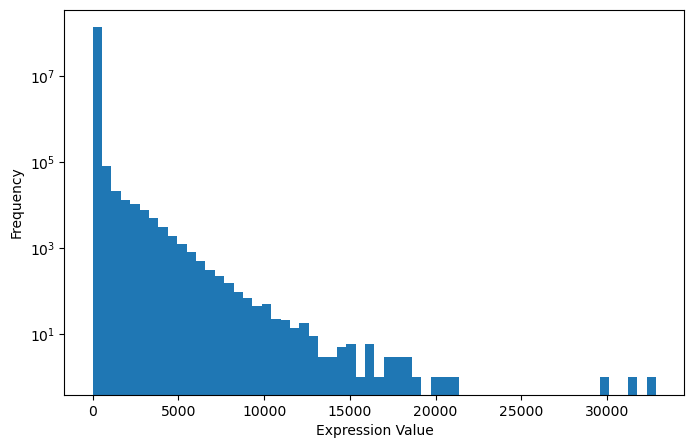

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Flatten the expression matrix (convert sparse to dense if necessary)
X = gene_adata.X
if not isinstance(X, np.ndarray):
    X = X.toarray()  # If sparse

# Plot histogram
plt.figure(figsize=(8, 5))
plt.hist(X.flatten(), bins=60)
plt.xlabel("Expression Value")
plt.ylabel("Frequency")
plt.yscale("log")
plt.show()

17P04394 ACTA2 ENSG00000107796


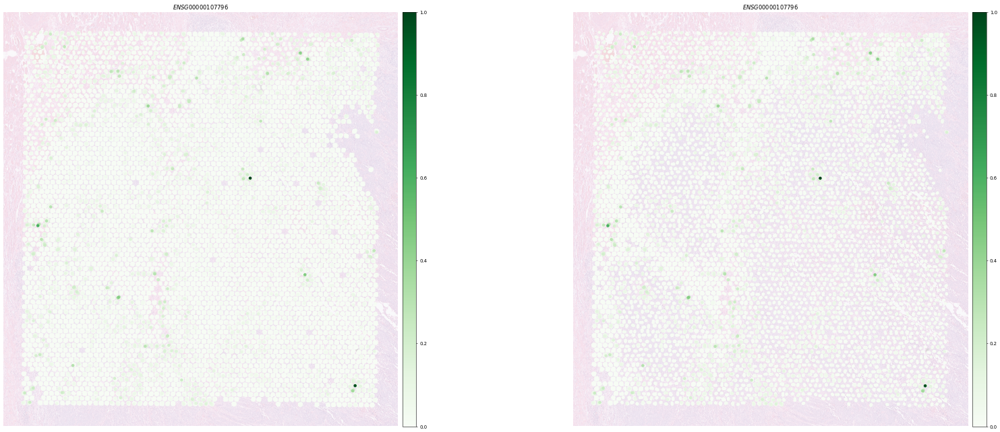

Not in genes
17P04394 ADH1B ENSG00000196616


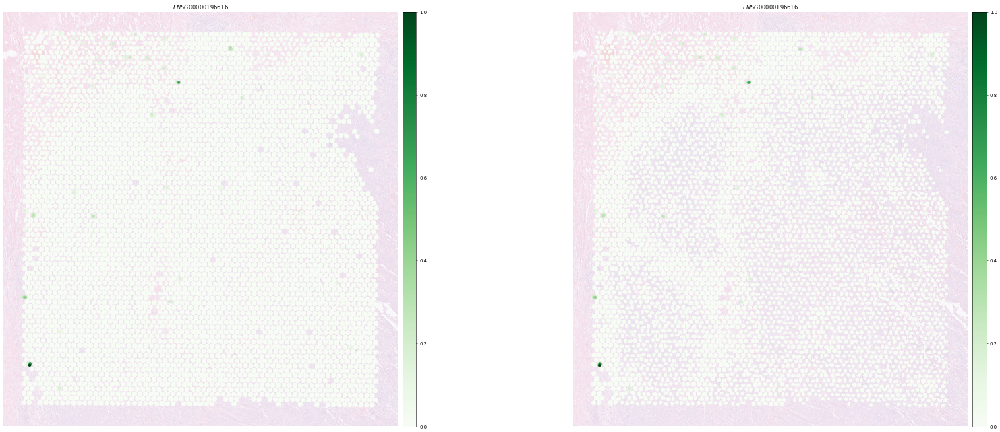

Not in genes
17P04394 CD3E ENSG00000198851


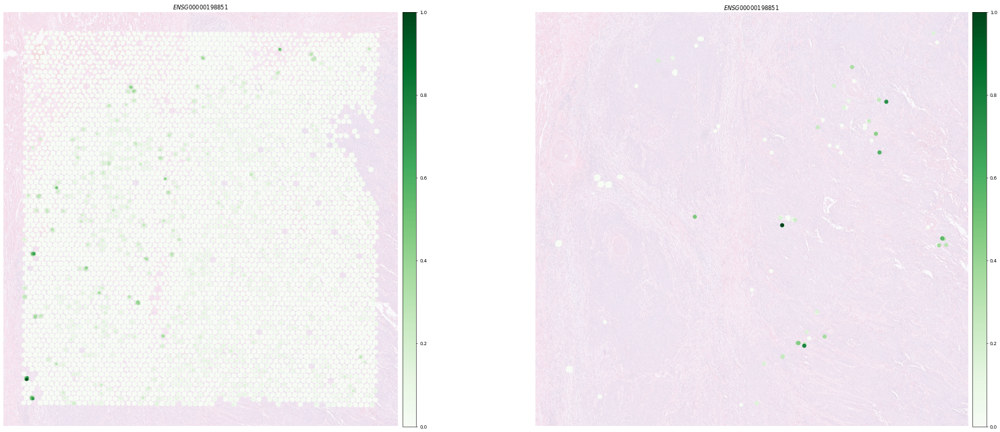

17P04394 CCND1 ENSG00000110092


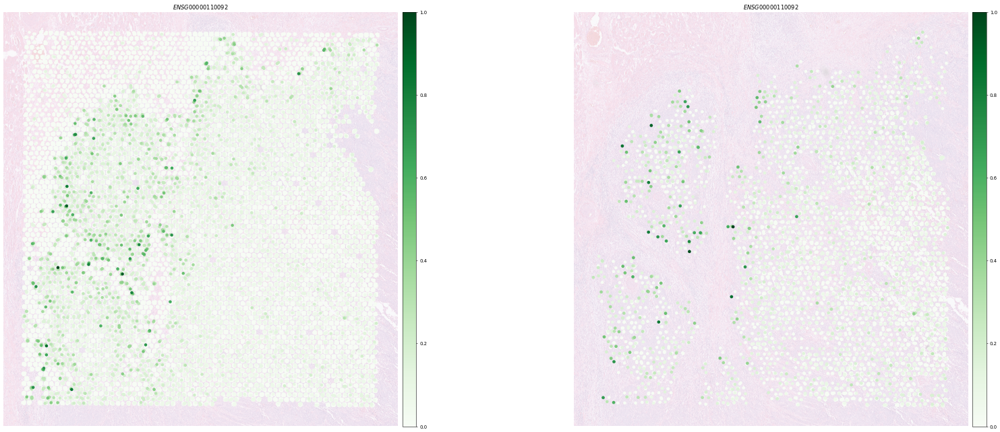

18P06762 ACTA2 ENSG00000107796


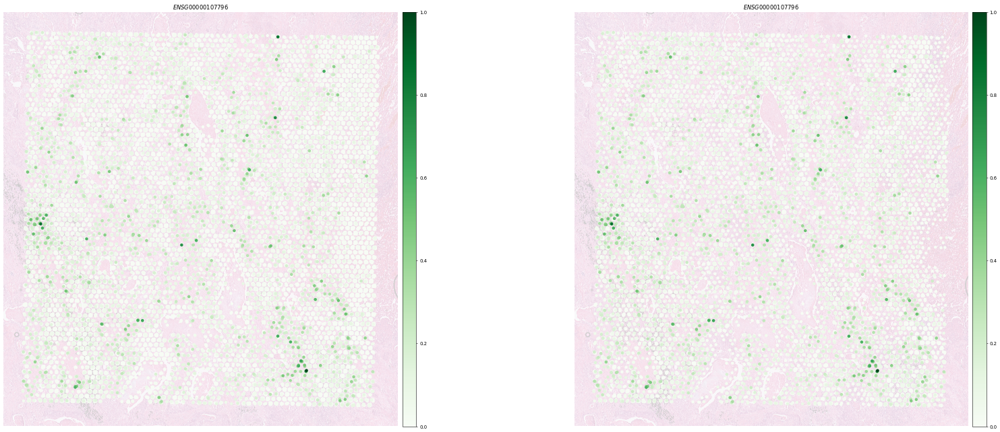

Not in genes
18P06762 ADH1B ENSG00000196616


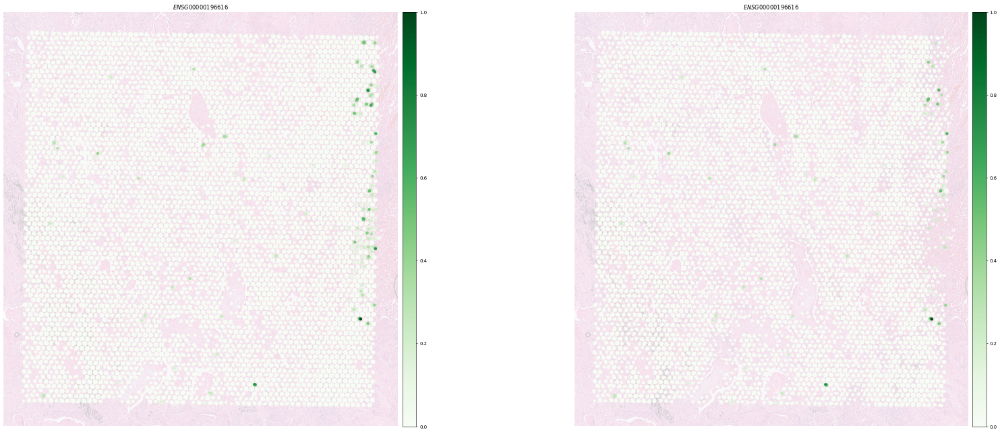

Not in genes
18P06762 CD3E ENSG00000198851


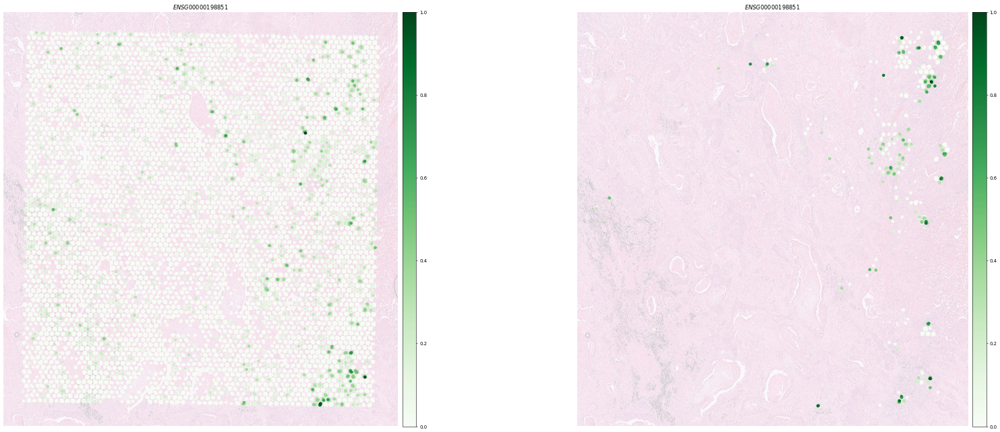

18P06762 CCND1 ENSG00000110092


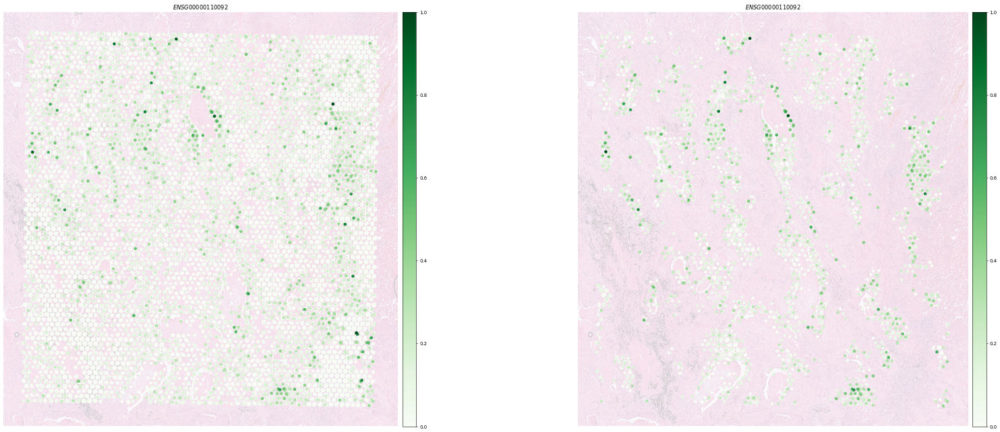

In [11]:
for slide in slides:
    results_dir = "/home/agathes/work/results"
    gene_exp_dir = os.path.join(
        results_dir,
        "spatialscope_deconv/third_run/deconv_normalised/",
        slide,
        "decomposed_gene_exp.h5ad",
    )
    gene_adata = sc.read_h5ad(gene_exp_dir)
    id_names = pd.DataFrame(
        {
            "ensemble_ids": np.array(gene_adata.var_names, dtype=str),
            "gene_names": gene_adata.var["feature_name"].to_xarray(),
        }
    )
    gene_list = ["ACTA2", "MYH11", "ADH1B", "FAP"]
    cell_type = "tumor-fibroblast"
    plot_gene_exp(slide, gene_list, cell_type, gene_adata, id_names)
    gene_list = ["CD3E"]
    cell_type = "tumor-T cell"
    plot_gene_exp(slide, gene_list, cell_type, gene_adata, id_names)
    gene_list = ["CCND1"]
    cell_type = "tumor-malignant cell"
    plot_gene_exp(slide, gene_list, cell_type, gene_adata, id_names)

### Explore correspondence between gene expression and model nodes

In [12]:
sizek_df = pd.read_csv(
    "/home/agathes/work/PhysiBoSS_Personalisation/models/sizek_dictionary.csv"
)
sizek_gene_nodes = sorted(
    sizek_df["Genes"][sizek_df["Genes"] != "Not_assigned"].to_list()
)
sizek_ensembl = np.array(convert_genes_ensembles(sizek_gene_nodes))
print(sizek_ensembl.shape)
sizek_ensembl

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2 input query terms found no hit:	['NEDDL4', 'UBCH10']


(52, 2)


array([['AKT1', 'ENSG00000142208'],
       ['AKT1S1', 'ENSG00000204673'],
       ['ATR', 'ENSG00000175054'],
       ['BAD', 'ENSG00000002330'],
       ['BAX', 'ENSG00000087088'],
       ['BCL2', 'ENSG00000171791'],
       ['BCL2L1', 'ENSG00000171552'],
       ['BCL2L11', 'ENSG00000153094'],
       ['BID', 'ENSG00000015475'],
       ['BIK', 'ENSG00000100290'],
       ['BRAF', 'ENSG00000157764'],
       ['CA2', 'ENSG00000104267'],
       ['CAD', 'ENSG00000084774'],
       ['CASP2', 'ENSG00000106144'],
       ['CASP3', 'ENSG00000164305'],
       ['CASP8', 'ENSG00000064012'],
       ['CASP9', 'ENSG00000132906'],
       ['CCNA1', 'ENSG00000133101'],
       ['CCNB1', 'ENSG00000134057'],
       ['CCND1', 'ENSG00000110092'],
       ['CCNE1', 'ENSG00000105173'],
       ['CDC20', 'ENSG00000117399'],
       ['CDC25A', 'ENSG00000164045'],
       ['CDC25B', 'ENSG00000101224'],
       ['CDC25C', 'ENSG00000158402'],
       ['CDC6', 'ENSG00000094804'],
       ['CDH1', 'ENSG00000039068'],
       ['CDK1

In [13]:
sp_genes = sorted(gene_adata.var["feature_name"].to_list())
sp_ensembl = np.array(convert_genes_ensembles(sp_genes))
print(sp_ensembl.shape)
sp_ensembl

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
55 input query terms found dup hits:	[('ACTE1P', 2), ('ATP11B-DT', 2), ('C22orf46P', 2), ('CCDC18-AS1', 2), ('CDC42-IT1', 2), ('CHASERR',
228 input query terms found no hit:	['C12orf40', 'C20orf85', 'C21orf62-AS1', 'C2orf88', 'C3_ENSG00000125730', 'C4orf3', 'C7_ENSG00000112


(1960, 2)


array([['A2M', 'ENSG00000175899'],
       ['AANAT', 'ENSG00000129673'],
       ['ACAP1', 'ENSG00000072818'],
       ...,
       ['ZPBP2', 'ENSG00000186075'],
       ['ZPLD1', 'ENSG00000170044'],
       ['ZSCAN10', 'ENSG00000130182']], dtype='<U25')

In [14]:
common_gene = list(set(sizek_ensembl[:, 1]) & set(sp_ensembl[:, 1]))
print(len(common_gene))
common_gene

52


['ENSG00000157764',
 'ENSG00000106615',
 'ENSG00000104267',
 'ENSG00000170312',
 'ENSG00000167513',
 'ENSG00000149554',
 'ENSG00000204673',
 'ENSG00000084774',
 'ENSG00000171552',
 'ENSG00000164305',
 'ENSG00000106144',
 'ENSG00000124762',
 'ENSG00000150907',
 'ENSG00000198793',
 'ENSG00000101224',
 'ENSG00000132906',
 'ENSG00000164327',
 'ENSG00000101412',
 'ENSG00000134057',
 'ENSG00000100290',
 'ENSG00000015475',
 'ENSG00000158402',
 'ENSG00000094804',
 'ENSG00000064012',
 'ENSG00000111276',
 'ENSG00000152256',
 'ENSG00000175054',
 'ENSG00000151247',
 'ENSG00000039068',
 'ENSG00000133703',
 'ENSG00000177885',
 'ENSG00000133101',
 'ENSG00000111206',
 'ENSG00000118689',
 'ENSG00000166851',
 'ENSG00000108443',
 'ENSG00000105173',
 'ENSG00000142208',
 'ENSG00000087088',
 'ENSG00000121858',
 'ENSG00000117399',
 'ENSG00000164045',
 'ENSG00000171791',
 'ENSG00000136997',
 'ENSG00000103197',
 'ENSG00000121879',
 'ENSG00000110092',
 'ENSG00000166483',
 'ENSG00000082701',
 'ENSG00000153094',


In [15]:
gene_adata.var.keys()

Index(['feature_name'], dtype='object')

In [16]:
gene_adata = gene_adata[:, sizek_ensembl[:, 1]]

In [17]:
gene_adata.X[:10, :]

ArrayView([[2.65943613e-02, 1.01462996e-03, 1.85311642e-02,
            5.88091230e-03, 1.91452637e+01, 9.58923530e-03,
            0.00000000e+00, 2.30760965e-02, 0.00000000e+00,
            1.15719633e-02, 4.87460708e-03, 7.49762869e-03,
            2.28716922e-03, 1.95684824e-02, 5.64080477e-03,
            1.19143724e-03, 2.10750103e-03, 9.12570953e-03,
            9.30355024e-03, 2.19231453e-02, 5.98941231e-03,
            0.00000000e+00, 5.85226202e-03, 9.12785530e-03,
            4.74425172e-03, 4.33452940e-03, 7.75094843e-03,
            3.07293725e-03, 0.00000000e+00, 1.06368923e+01,
            5.82810258e-03, 4.16966295e-03, 5.16939163e-03,
            6.22473145e-03, 3.43330693e-03, 2.09966097e-02,
            5.70073891e+00, 2.08351221e-02, 0.00000000e+00,
            1.97237339e-02, 0.00000000e+00, 3.54576111e-03,
            0.00000000e+00, 4.51076031e-03, 1.86009798e-02,
            6.07943535e-03, 1.28723783e-02, 1.17123527e-02,
            6.09799242e-03, 1.05831947e+